<a href="https://colab.research.google.com/github/kevcabrerah/Probability_Statistics/blob/main/Kevin_Cabrera_NB_Lab_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://tensorspace.org/

In [ ]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

In [ ]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()
    
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

model = alexnet(weights='DEFAULT').to(device)
model.eval();

In [ ]:
url = "https://docs.google.com/presentation/d/1lyE52a0yLCu9iUiKeFmdKayGJhu2Z6fyToXEMKeigoY/edit#slide=id.p"

In [ ]:
url = "https://docs.google.com/presentation/d/16sV5PJX95bt5s4CbKEKn9yyrbHlh_yLPBjpZuLkZGmY/edit#slide=id.g1a19eac4471_0_225"

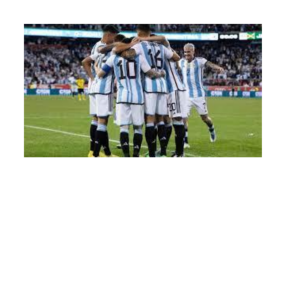

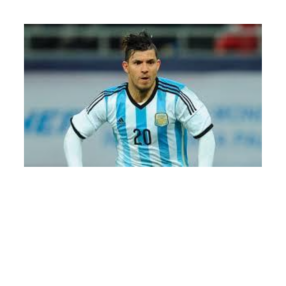

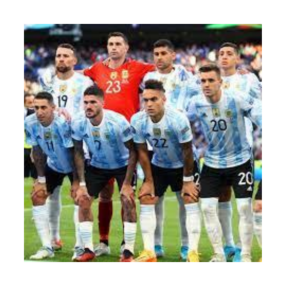

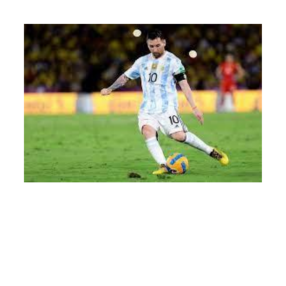

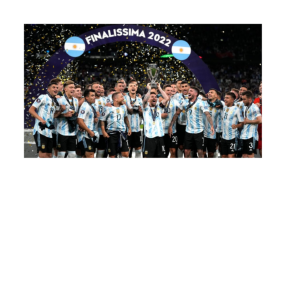

...

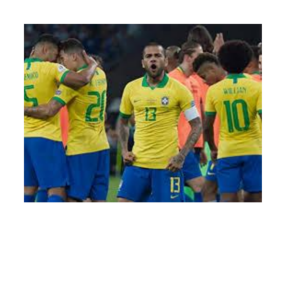

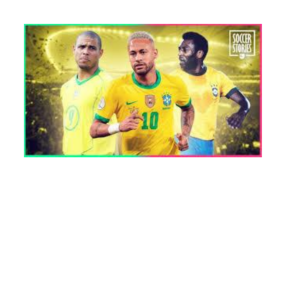

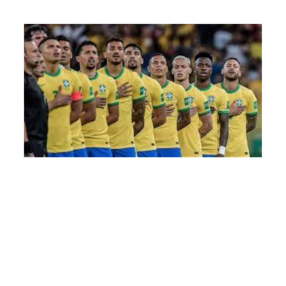

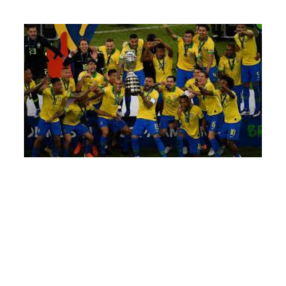

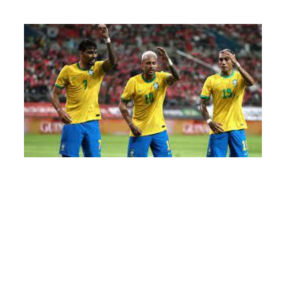

In [ ]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

In [ ]:
images.shape

torch.Size([100, 3, 224, 224])

In [ ]:
model(images)

tensor([[-2.8300, -3.8466, -2.3740,  ..., -5.1379,  0.9658,  1.2329],
        [ 0.0908, -1.9960, -2.0243,  ..., -5.2720, -1.0279,  2.5272],
        [-1.8642, -0.3852, -1.7777,  ..., -4.6227,  5.4944,  2.5649],
        ...,
        [-2.6094, -1.5864, -3.1283,  ..., -2.8210,  4.9063,  1.8911],
        [-3.1195, -2.0298, -2.7440,  ..., -4.1351,  2.7643,  1.9463],
        [-3.6538, -2.0681, -2.4352,  ..., -3.9034,  3.8839,  0.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images)

In [ ]:
y.shape

torch.Size([100, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [ ]:
for i in list(guesses):
    print(labels[i])

monitor
web site, website, internet site, site
torch
Sealyham terrier, Sealyham
hair slide
web site, website, internet site, site
reel
web site, website, internet site, site
web site, website, internet site, site
safety pin
web site, website, internet site, site
web site, website, internet site, site
web site, website, internet site, site
lab coat, laboratory coat
web site, website, internet site, site
web site, website, internet site, site
television, television system
golf ball
web site, website, internet site, site
abacus
soccer ball
web site, website, internet site, site
web site, website, internet site, site
web site, website, internet site, site
web site, website, internet site, site
steel drum
web site, website, internet site, site
web site, website, internet site, site
web site, website, internet site, site
television, television system
horizontal bar, high bar
television, television system
notebook, notebook computer
book jacket, dust cover, dust jacket, dust wrapper
horizonta

In [ ]:
Y = np.zeros(100,)
Y[25:] = 1

In [ ]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() 

In [ ]:
X.shape

(100, 1000)

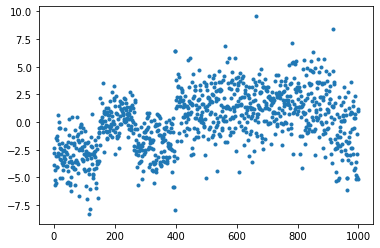

In [ ]:
plt.plot(X[0],'.')

(array([  6.,  34., 110., 176., 242., 259., 128.,  38.,   5.,   2.]),
 array([-8.294144  , -6.5076437 , -4.7211432 , -2.9346433 , -1.148143  ,
         0.63835716,  2.4248574 ,  4.2113576 ,  5.9978576 ,  7.784358  ,
         9.570858  ], dtype=float32),
 <a list of 10 Patch objects>)

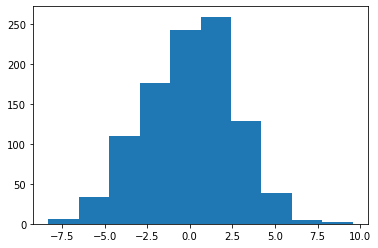

In [ ]:
plt.hist(X[0])

In [ ]:
X[0]

array([-2.83001184e+00, -3.84661531e+00, -2.37402821e+00, -5.68762970e+00,
       -5.23569059e+00, -4.32640362e+00, -5.50462294e+00, -3.01935315e+00,
       -1.39356613e+00, -4.03098869e+00, -4.07657719e+00, -1.29733086e+00,
       -1.58618128e+00, -3.03316355e+00,  6.29673481e-01, -2.82155466e+00,
       -5.41386664e-01,  3.24440412e-02, -1.94469738e+00, -5.72780788e-01,
       -3.34395695e+00, -2.35210109e+00, -5.03179216e+00, -2.44688487e+00,
       -3.45283508e+00, -2.87488770e+00, -5.00621986e+00, -3.72310853e+00,
       -1.84076262e+00, -4.35649014e+00, -3.84068465e+00, -2.56911087e+00,
       -3.21141624e+00, -3.08993530e+00, -3.58205700e+00, -2.50693011e+00,
       -6.02154016e-01, -3.30450916e+00, -2.15211678e+00, -2.67646646e+00,
       -2.06569219e+00, -3.93983126e+00, -5.54418516e+00, -2.83752418e+00,
       -3.96451139e+00, -2.24562597e+00, -4.37669945e+00, -1.78777051e+00,
       -5.39401340e+00, -3.63273096e+00, -1.14972937e+00,  2.95810699e-01,
       -5.47307968e+00, -

In [ ]:
np.argmax(X[0])

664

In [ ]:
X = GPU_data(X)
Y = GPU_data(Y)

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10]

In [ ]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

X[0]

np.argmax(X[0],'.')

labels[948]

top_ten = np.argsort(X[0])[::-1][0:10]

In [ ]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [ ]:
def cross_entropy(outputs, labels):            
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]  

In [ ]:
def randn_trunc(s): #Truncated Normal Random Numbers
    mu = 0 
    sigma = 0.1
    R = stats.truncnorm((-2*sigma - mu) / sigma, (2*sigma - mu) / sigma, loc=mu, scale=sigma)
    return R.rvs(s)

In [ ]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [ ]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [ ]:
X.shape

torch.Size([100, 1000])

In [ ]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b) 
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [ ]:
def model(x,w):

    return x@w[0]

In [ ]:
def make_plots():
    
    acc_train = acc(model(x,w),y)
    
    # xt,yt = get_batch('test')

    # acc_test = acc(model(xt,w),yt)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 32
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)  

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
   
    wb.log({"loss": loss})

    make_plots()


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/click/termui.py", line 129, in prompt_func
    return f("")
  File "/usr/local/lib/python3.8/dist-packages/click/termui.py", line 54, in hidden_prompt_func
    return getpass.getpass(prompt)
  File "/usr/local/lib/python3.8/dist-packages/ipykernel/kernelbase.py", line 843, in getpass
    return self._input_request(prompt,
  File "/usr/local/lib/python3.8/dist-packages/ipykernel/kernelbase.py", line 904, in _input_request
    raise KeyboardInterrupt("Interrupted by user") from None
KeyboardInterrupt: Interrupted by user

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/

Exception: ignored